In [5]:
import numpy as np
import pandas as pd
from importlib import reload
import util
reload(util)
data = util.FontData

In [6]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [7]:
data.load(knn_path='data/ensemble_dataset.csv')

Loading embeddings...done
Loading typographic + semantic vectors...done
Loading images...Image data not found; ignoring...done
Loading glyphs...done
Loading SVGs...done


In [10]:
embeddings = data.get_all_embedding('all')
embeddings_pca = pca.fit_transform(embeddings)

In [11]:
semantic = data.get_all_semantic('all')

In [12]:
attribute_names = np.loadtxt('data/attrNames.txt', dtype=str)
typographic_features = np.asarray(['font_name', 'capitals', 'cursive', 'display', 'italic', 'monospace', 'serif'])
semantic_features = attribute_names[~np.isin(attribute_names, typographic_features)]

In [16]:
dir_path = 'data/'
fj_unlabeled_font_vectors = pd.read_pickle(dir_path + 'fj_ul_font_vectors.pkl')
fj_labeled_font_vectors = pd.read_pickle(dir_path + 'fj_l_font_vectors.pkl')
common_attribute_labels = pd.read_pickle(dir_path + 'common_attribute_labels.pkl')

In [17]:
X = fj_labeled_font_vectors.iloc[:, 1:]
y = common_attribute_labels.iloc[:, 1:]

In [95]:
pca = PCA(n_components=2)

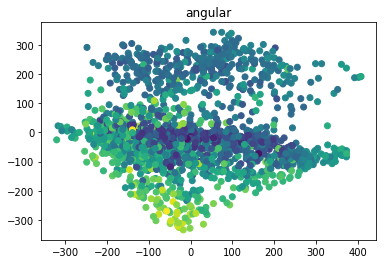

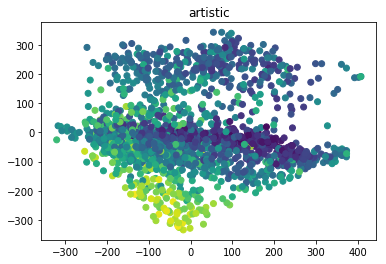

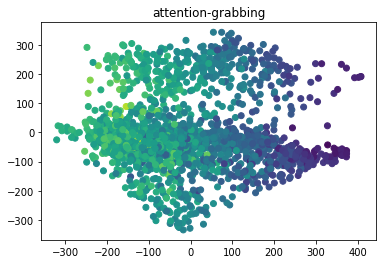

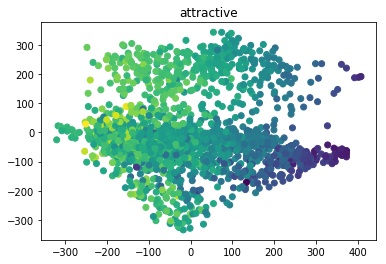

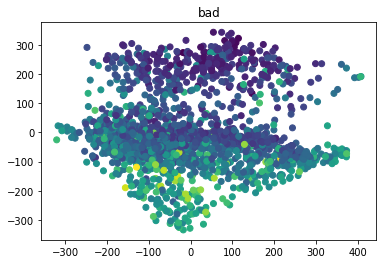

...

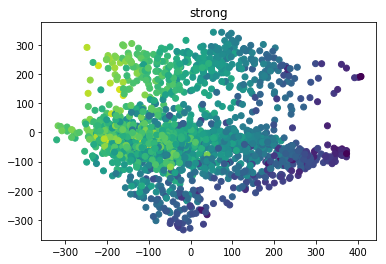

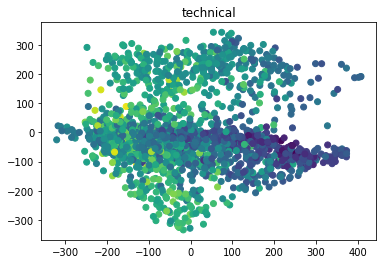

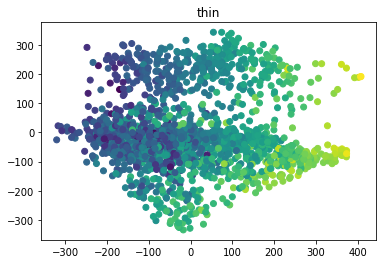

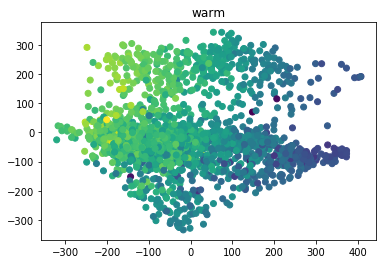

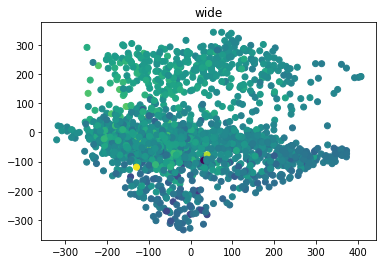

In [97]:
for i in range(0, semantic.shape[1]):
    y_1d = semantic[:, i]
    X0, X1 = embeddings_pca[:, 0], embeddings_pca[:, 1]
    ax = plt.gca()
    ax.scatter(X0, X1, c=y_1d, cmap=plt.cm.viridis)
    ax.set_title(semantic_features[i])
    plt.show()

In [78]:
X_pca = pca.fit_transform(X)

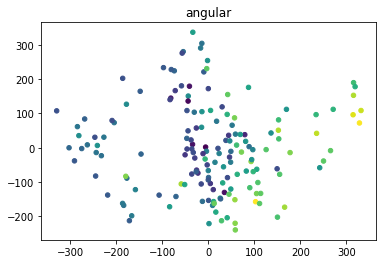

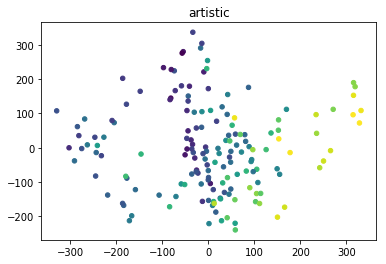

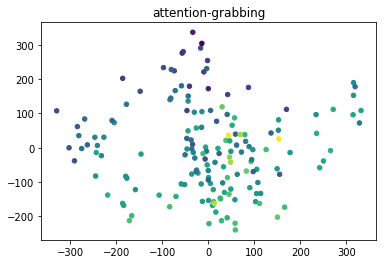

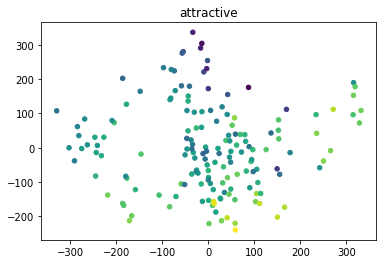

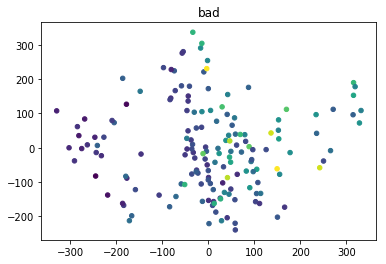

...

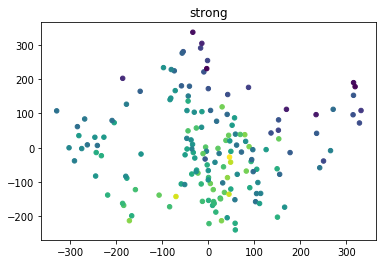

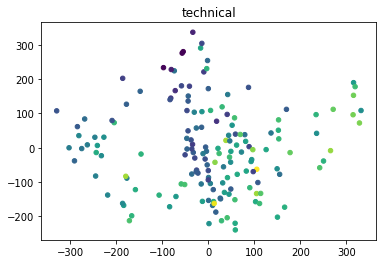

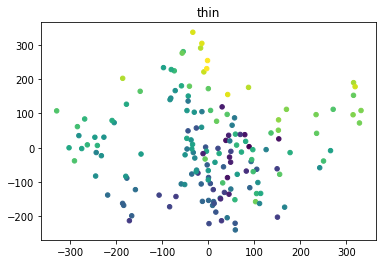

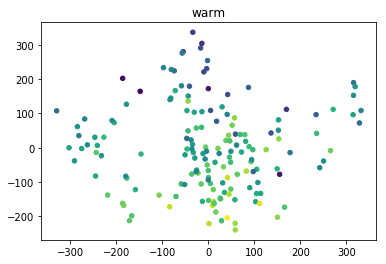

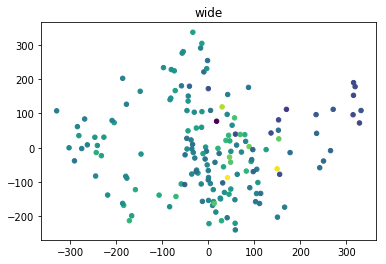

In [81]:
for i in range(0, y.shape[1]):
    if attribute_names[i] in semantic_features:
        y_1d = y.iloc[:, i]
        X0, X1 = X_pca[:, 0], X_pca[:, 1]
        ax = plt.gca()
        ax.scatter(X0, X1, c=y_1d, cmap=plt.cm.viridis, s=20)
        ax.set_title(attribute_names[i])
        plt.show()

In [13]:
pca = PCA(n_components=3)

In [14]:
embeddings_pca = pca.fit_transform(embeddings)

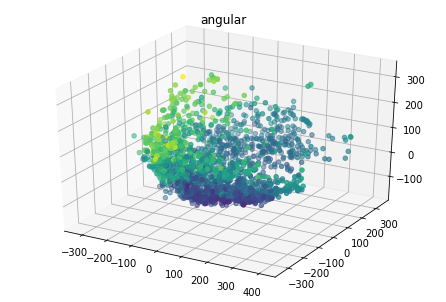

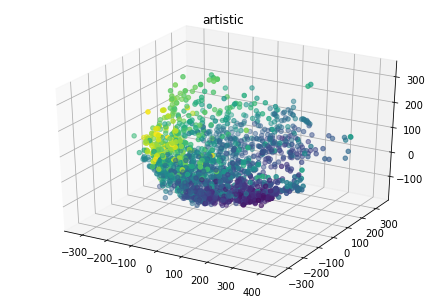

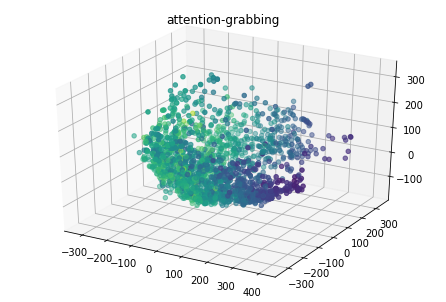

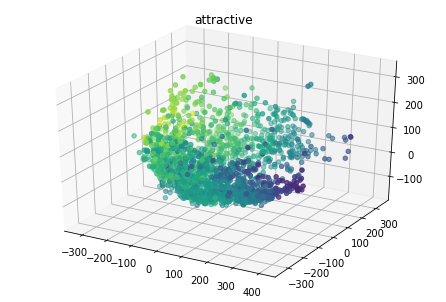

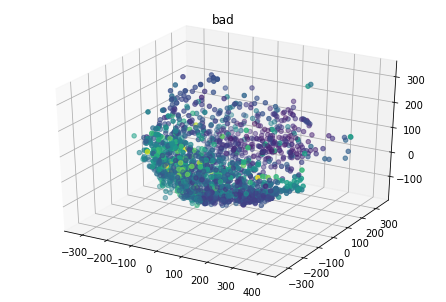

...

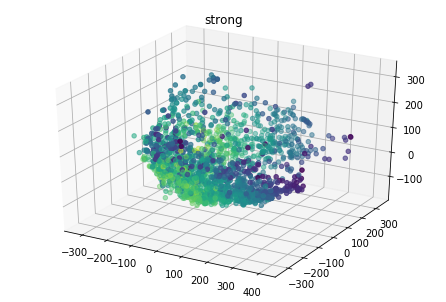

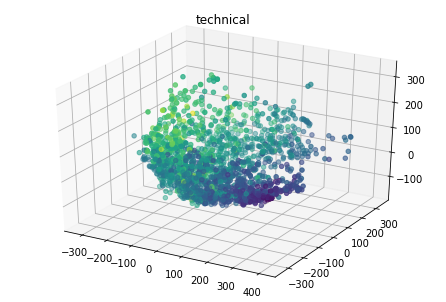

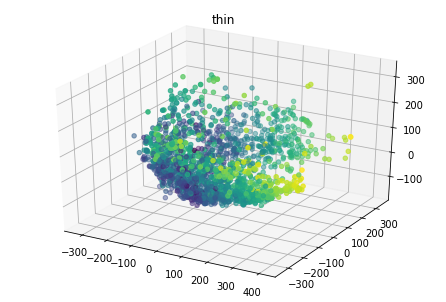

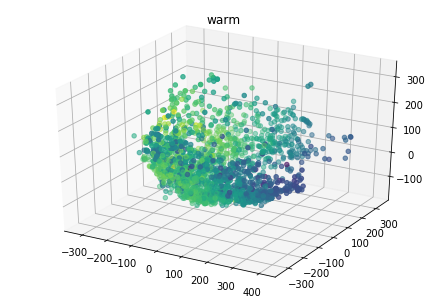

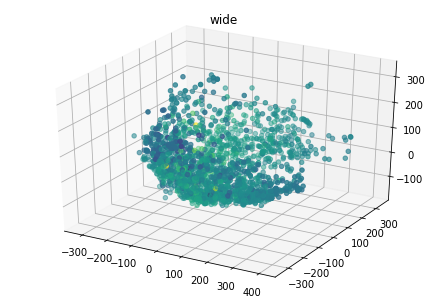

In [15]:
for i in range(0, semantic.shape[1]):
    y_1d = semantic[:, i]
    X0, X1, X2 = embeddings_pca[:, 0], embeddings_pca[:, 1], embeddings_pca[:, 2]
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.scatter(X0, X1, X2, c=y_1d, cmap=plt.cm.viridis)
    ax.set_title(semantic_features[i])
    plt.show()

In [18]:
X_pca = pca.fit_transform(X)

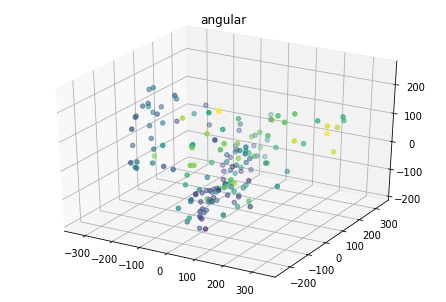

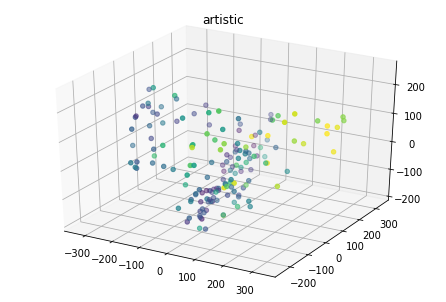

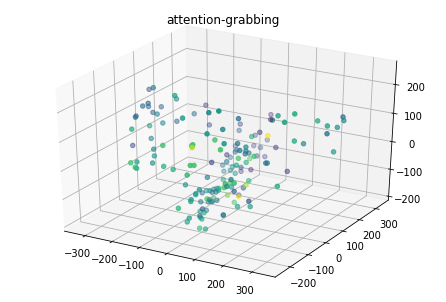

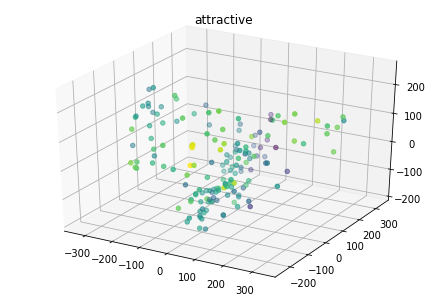

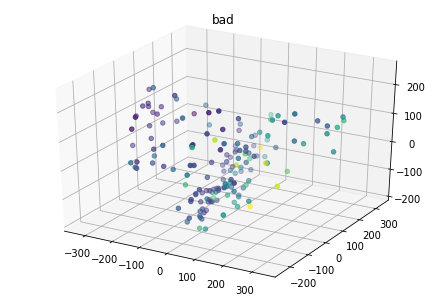

...

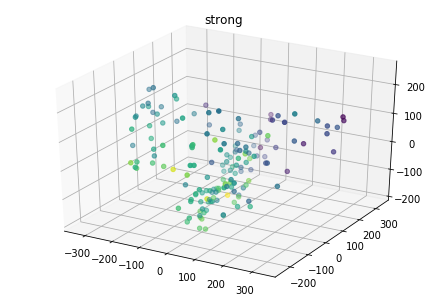

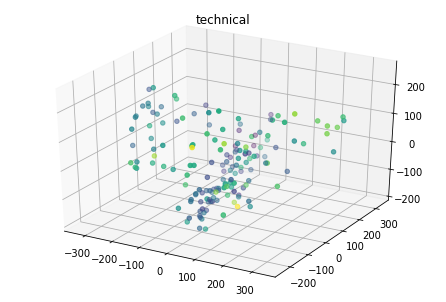

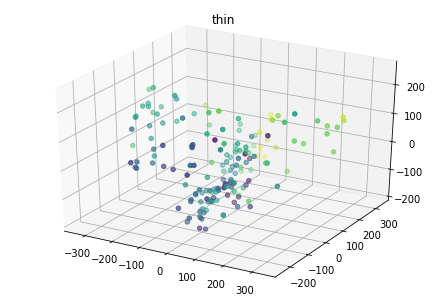

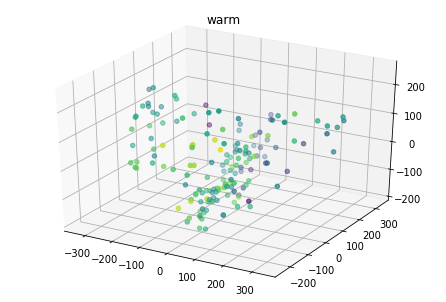

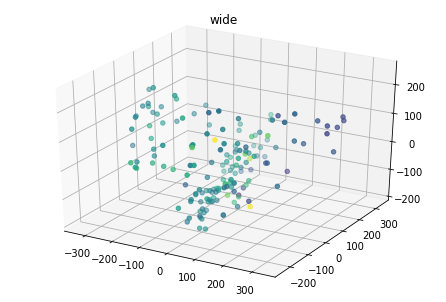

In [19]:
for i in range(0, y.shape[1]):
    if attribute_names[i] in semantic_features:
        y_1d = y.iloc[:, i]
        X0, X1, X2 = X_pca[:, 0], X_pca[:, 1], X_pca[:, 2]
        fig = plt.figure()
        ax = Axes3D(fig)
        ax.scatter(X0, X1, X2, c=y_1d, cmap=plt.cm.viridis, s=20)
        ax.set_title(attribute_names[i])
        plt.show()

In [30]:
import os
import pickle
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import VotingRegressor

def get_weights_kulah(distances):
	k = distances.shape[1]
	numerator = (np.sum(distances, axis=1) - distances.T).T
	denominator = np.sum(distances)
	weights = (1 / (k - 1)) * (numerator/denominator)
	return weights

def get_hyper_params(filename):
	hyper_params = {}
	if not os.path.exists(dir_path + filename):
		C_range = np.logspace(0, 4, 5)
		gamma_range = np.logspace(-10, -1, 10)
		param_grid = dict(gamma=gamma_range, C=C_range)
		cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
		grid = GridSearchCV(SVR(kernel='rbf'), param_grid=param_grid, cv=cv)
		for i in range(y.shape[1]):
			grid.fit(X, y.iloc[:, i])
			hyper_params[i] = grid.best_params_
			# print("The best parameters are %s with a score of %0.2f"
			#       % (grid.best_params_, grid.best_score_))
		with open(dir_path + filename, 'wb') as file:
			pickle.dump(hyper_params, file, protocol=pickle.HIGHEST_PROTOCOL)
	else:
		hyper_params = None
		with open(dir_path + filename, 'rb') as file:
			hyper_params = pickle.load(file)
	return hyper_params

In [65]:
hyper_params = get_hyper_params('hyper_params.pkl')

result = []
nn_4 = KNeighborsRegressor(n_neighbors=4, weights=get_weights_kulah, metric='cosine')
nn_7 = KNeighborsRegressor(n_neighbors=7, weights='distance', metric='cosine')
for i in range(y.shape[1]):
    preds = np.asarray([])
    y_1d = y.iloc[:, i]
    rbf = SVR(kernel='rbf', C=hyper_params[i]['C'], gamma=hyper_params[i]['gamma'])
    model = VotingRegressor(estimators=[('4nn', nn_4), ('7nn', nn_7), ('rbf', rbf)], weights=[0.15, 0.15, 0.7])
    for j, row in X.iterrows():
        model.fit(X.drop(index=j), y_1d.drop(index=j))
        f_p = model.predict(X.iloc[j, :].values.reshape(1, -1)).flatten()
        preds = np.append(preds, f_p)
    preds = preds.flatten()
    result.append(preds)
result = np.asarray(result)

In [68]:
result = pd.DataFrame(data=result, index=attribute_names, columns=fj_labeled_font_vectors.iloc[:, 0])
semantic_result = result[result.index.isin(semantic_features)].T

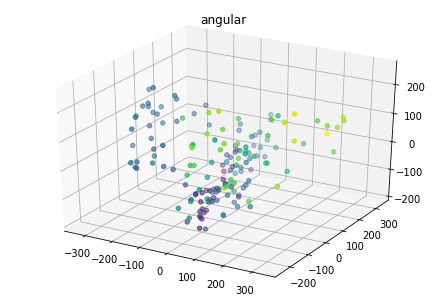

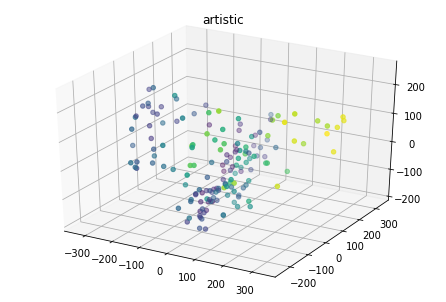

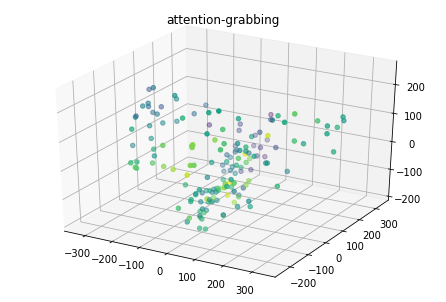

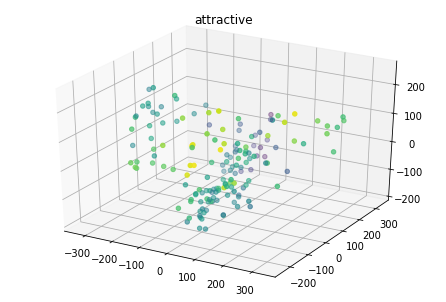

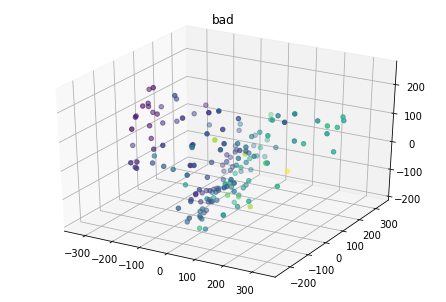

...

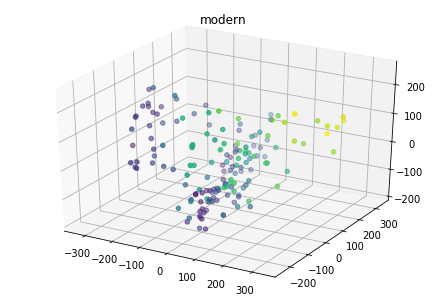

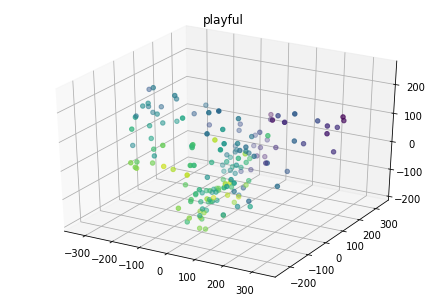

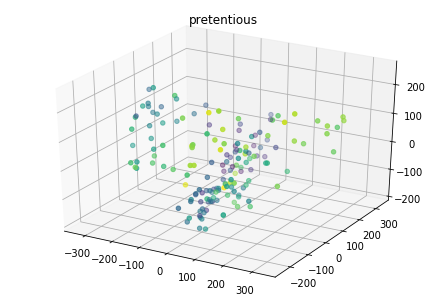

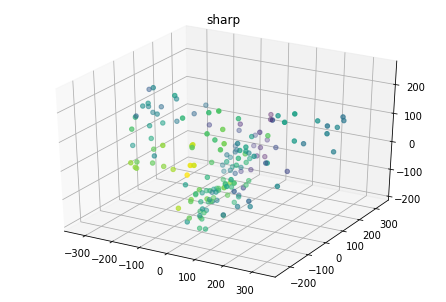

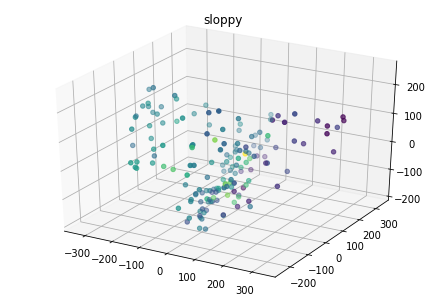

IndexError: single positional indexer is out-of-bounds

In [71]:
for i in range(0, y.shape[1]):
    if attribute_names[i] in semantic_features:
        y_1d = semantic_result.iloc[:, i]
        X0, X1, X2 = X_pca[:, 0], X_pca[:, 1], X_pca[:, 2]
        fig = plt.figure()
        ax = Axes3D(fig)
        ax.scatter(X0, X1, X2, c=y_1d, cmap=plt.cm.viridis, s=20)
        ax.set_title(attribute_names[i])
        plt.show()